In [2]:
from scipy.sparse import csr_matrix
import numpy as np
import h5py
import scanpy as sc
import anndata

import matplotlib.pyplot as plt
import seaborn as sns

import pandas as pd

# Data is obtained from the Kaggle dataset

In [6]:

merged_path = '/scratch/indikar_root/indikar1/shared_data/HYB/anndata/final/raw_hyb_scfib_merged_may_9.h5ad'
# adata = sc.read_h5ad(merged_path, 'r')
adata = sc.read_h5ad(merged_path)

print(adata.X.shape)

# To access metadata:

print(adata.obs.head())
# print(adata.var.head())
# adata.obs.assigned_condition.unique()


control_conditions = ['G2M', 'G1', 'S']
experimental_conditions = ['PRRX1_MYOD', 'MYOD', 'PRRX1']

adata.obs['condition'] = adata.obs['assigned_condition'].apply(lambda x: 'controls' if x not in experimental_conditions else x)

(19858, 28702)
                         MYOD-fb_counts  PRRX1-fb_counts  \
AAACCAAAGCAACTGC_hybrid             0.0              0.0   
AAACCAAAGCTATGAT_hybrid             1.0              1.0   
AAACCAAAGTAGCCGT_hybrid             1.0              0.0   
AAACCAAAGTAGGGCA_hybrid            14.0              1.0   
AAACCAAAGTCTAGGC_hybrid             0.0              0.0   

                         PRRX1_MYOD-fb_counts assigned_condition  \
AAACCAAAGCAACTGC_hybrid                  25.0         PRRX1_MYOD   
AAACCAAAGCTATGAT_hybrid                   6.0         PRRX1_MYOD   
AAACCAAAGTAGCCGT_hybrid                  21.0         PRRX1_MYOD   
AAACCAAAGTAGGGCA_hybrid                   1.0               MYOD   
AAACCAAAGTCTAGGC_hybrid                  25.0         PRRX1_MYOD   

                         total_fb_counts  condition_counts_rate  G1-fb_counts  \
AAACCAAAGCAACTGC_hybrid             25.0               1.000000           NaN   
AAACCAAAGCTATGAT_hybrid              8.0             

In [7]:

# Use a clean style
sc.set_figure_params(figsize=(8, 6), dpi=150, fontsize=12)


plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4.7, 5

# Preprocessing steps for the data

In [8]:
sc.pp.neighbors(adata)
sc.pp.pca(adata, n_comps=50)
sc.tl.leiden(adata, resolution=1.0, key_added='leiden')
sc.tl.umap(adata)
sc.tl.tsne(adata)
sc.tl.diffmap(adata)

/home/nuvi/.local/lib/python3.11/site-packages/scanpy/tools/_utils.py:40: UserWarning: You’re trying to run this on 28702 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(
/home/nuvi/.conda/envs/playground/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/tmp/ipykernel_2564834/1395921301.py:3: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=1.0, key_added='leiden')


# Scoring each cell based on Tirosh et al. genes

In [9]:
G1S_genes_Tirosh = ['MCM5', 'PCNA', 'TYMS', 'FEN1', 'MCM2', 'MCM4', 'RRM1', 'UNG', 'GINS2', 'MCM6', 'CDCA7', 'DTL', 'PRIM1', 'UHRF1', 'MLF1IP', 'HELLS', 'RFC2', 'RPA2', 'NASP', 'RAD51AP1', 'GMNN', 'WDR76', 'SLBP', 'CCNE2', 'UBR7', 'POLD3', 'MSH2', 'ATAD2', 'RAD51', 'RRM2', 'CDC45', 'CDC6', 'EXO1', 'TIPIN', 'DSCC1', 'BLM', 'CASP8AP2', 'USP1', 'CLSPN', 'POLA1', 'CHAF1B', 'BRIP1', 'E2F8']
G2M_genes_Tirosh = ['HMGB2', 'CDK1', 'NUSAP1', 'UBE2C', 'BIRC5', 'TPX2', 'TOP2A', 'NDC80', 'CKS2', 'NUF2', 'CKS1B', 'MKI67', 'TMPO', 'CENPF', 'TACC3', 'FAM64A', 'SMC4', 'CCNB2', 'CKAP2L', 'CKAP2', 'AURKB', 'BUB1', 'KIF11', 'ANP32E', 'TUBB4B', 'GTSE1', 'KIF20B', 'HJURP', 'CDCA3', 'HN1', 'CDC20', 'TTK', 'CDC25C', 'KIF2C', 'RANGAP1', 'NCAPD2', 'DLGAP5', 'CDCA2', 'CDCA8', 'ECT2', 'KIF23', 'HMMR', 'AURKA', 'PSRC1', 'ANLN', 'LBR', 'CKAP5', 'CENPE', 'CTCF', 'NEK2', 'G2E3', 'GAS2L3', 'CBX5', 'CENPA']

s_genes = G1S_genes_Tirosh
g2m_genes = G2M_genes_Tirosh

sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

# UMAP Projections of data

<Axes: title={'center': 'UMAP by Phase'}, xlabel='UMAP1', ylabel='UMAP2'>

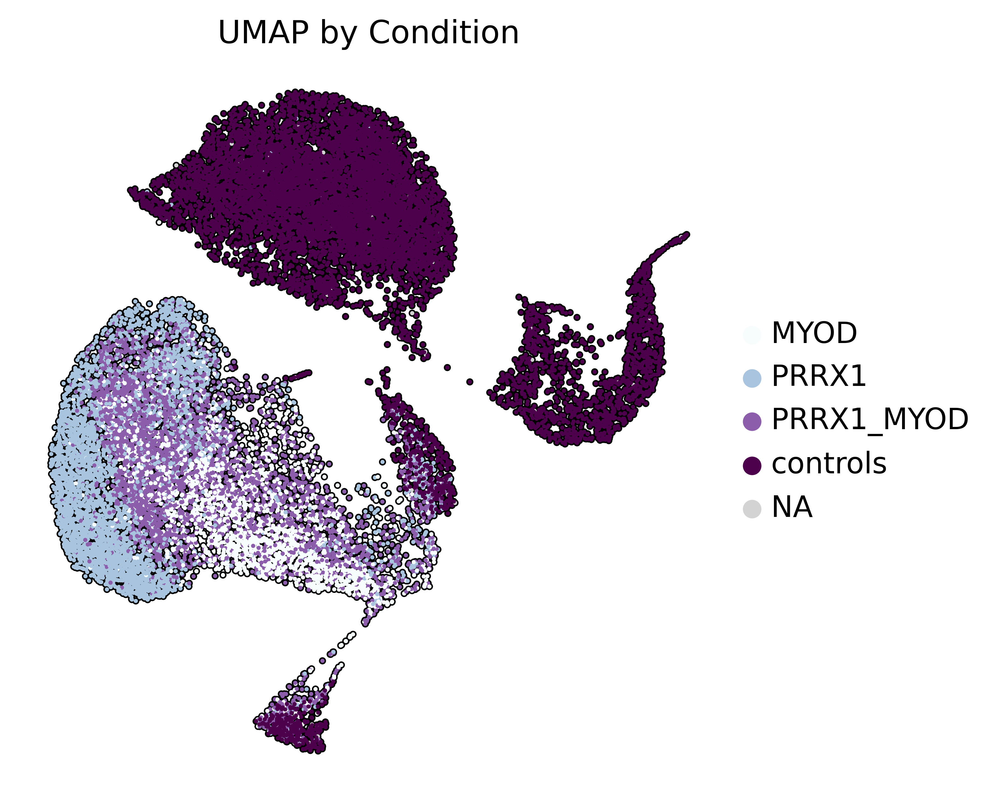

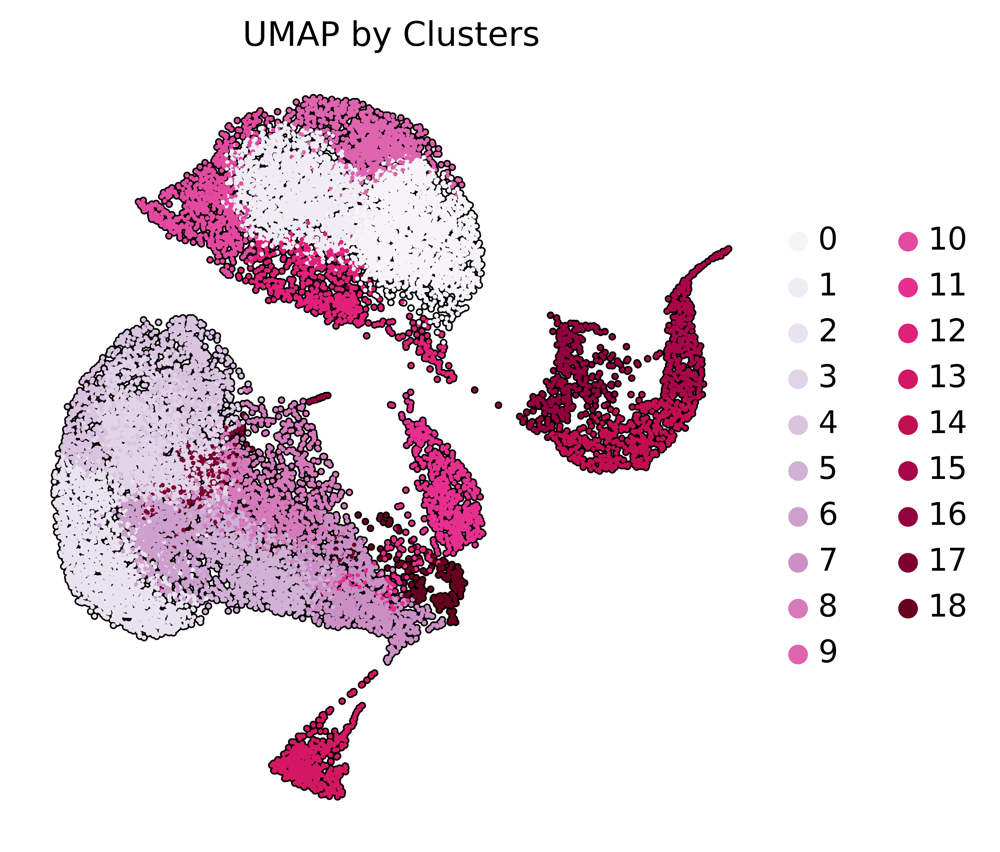

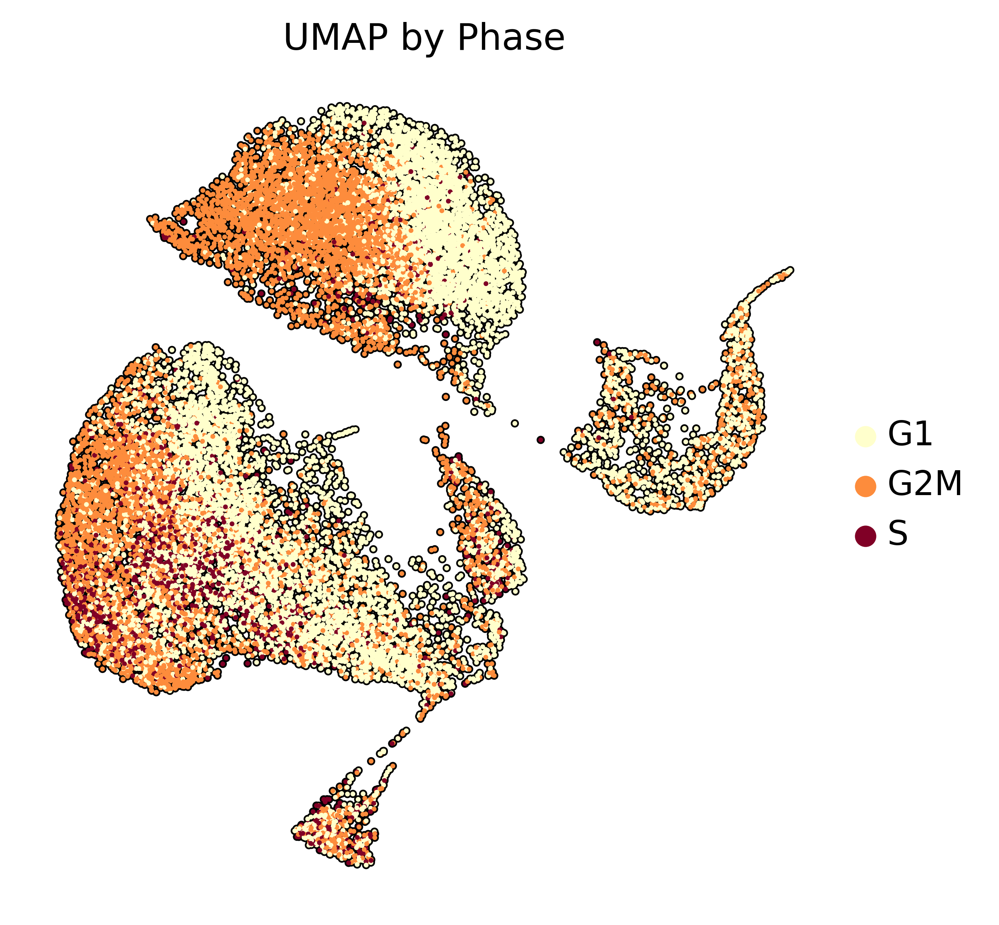

In [14]:

# color = [
#     "CD34",
#     "CD74",
#     "BST2",
#     "CD164",
#     "RUNX1",
#     "MYB",
#     "TAL1",
#     "MEIS1",
# ]


# # UMAP by condition
# sc.pl.umap(adata, color="condition", title="UMAP by Condition", palette="tab10")

# # UMAP by cell cycle phase
# sc.pl.umap(adata, color="pred_phase", title="UMAP by Cell Cycle Phase", palette="Set2")



# sc.pl.umap(adata, color="condition", title="UMAP by Condition")

palette = 'BuPu'

color = 'condition'
sc.pl.umap(
    adata,
    palette=palette,
    color=color,
    # sort_order=True,
    size=10,
    ncols=4,
    alpha=1,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    colorbar_loc=None,
    # palette='Blues',
    show=False, 
    title="UMAP by Condition")

# UMAP colored by Leiden clusters (or any clustering)
# sc.pl.umap(adata, 

palette = 'PuRd'
color="leiden"

sc.pl.umap(
    adata,
    palette=palette,
    color=color,
    # sort_order=True,
    size=10,
    ncols=4,
    alpha=1,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    colorbar_loc=None,
    # palette='Blues',
    show=False,
    title="UMAP by Clusters"
    )

# Split UMAPs by condition (very useful in papers)
# sc.pl.umap(adata, color="phase" , title="UMAP by phase")

palette = 'YlOrRd'
color = "phase"

sc.pl.umap(
    adata,
    palette=palette,
    color=color,
    # sort_order=True,
    size=10,
    ncols=4,
    alpha=1,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    colorbar_loc=None,
    # palette='Blues',
    show=False,
    title="UMAP by Phase"
    )


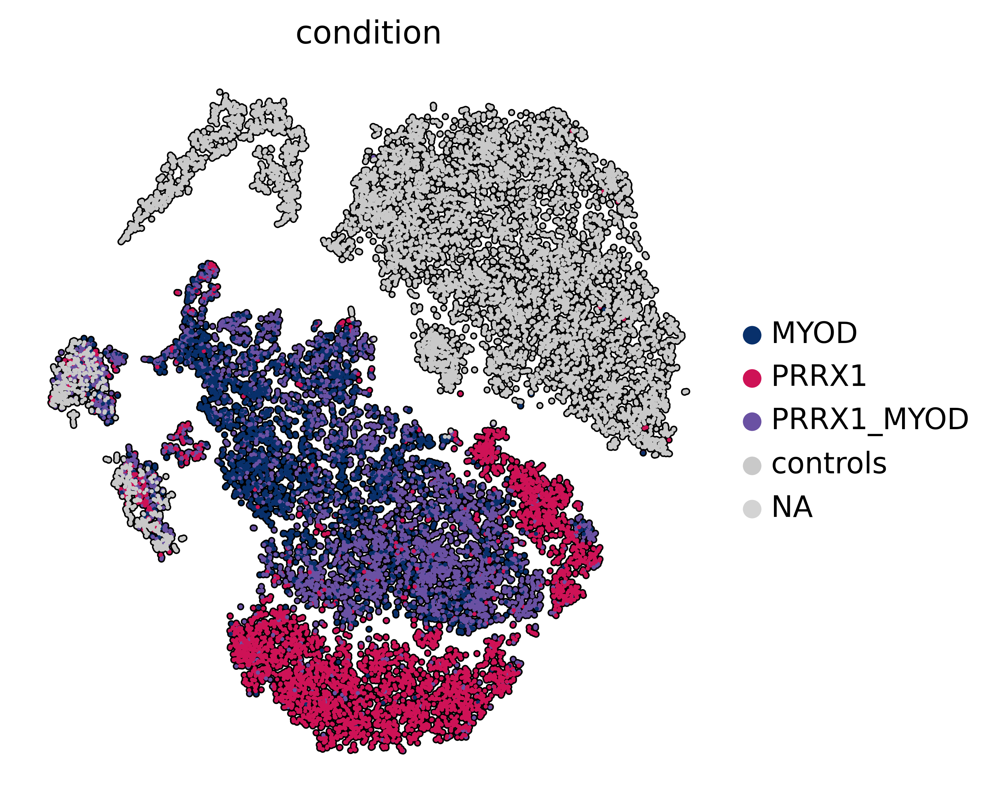

In [15]:
color="condition"

        # [
        #     "#5e4fa2",  # Deep purple
        #     "#7b68b0",  # Medium purple
        #     "#9988bf",  # Light lavender
        #     "#bfa7b7",  # Mauve / bridge color
        #     "#d88e6b",  # Orange-tan
        #     "#e07b45",  # Warm orange
        #     "#f46d43",  # Bright orange
        # ]

# colors = ["#b2dfdb", "#c5d9e2", "#d8cde2", "#ebc1d9", "#f8bbd0"]
colors = ["#08306b", "#2a4b8d", "#6a51a3", "#a53692", "#ce1256"]
# colors = ['#6815e6','#e3c1e6', '#e3c1e6', '#e3c1e6','#6815e6']

palette = {'MYOD': colors[0], 'PRRX1': colors[-1], 'PRRX1_MYOD': colors[2], 'controls': '#c9c9c9', 'NA': 'grey'}
sc.pl.tsne(
    adata,
    palette=palette,
    color=color,
    # sort_order=True,
    size=10,
    ncols=4,
    alpha=1,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    colorbar_loc=None,
    # palette='Blues',
    show=False
)

plt.savefig('umap_by_condition.png', bbox_inches='tight', transparent=True, dpi=300)

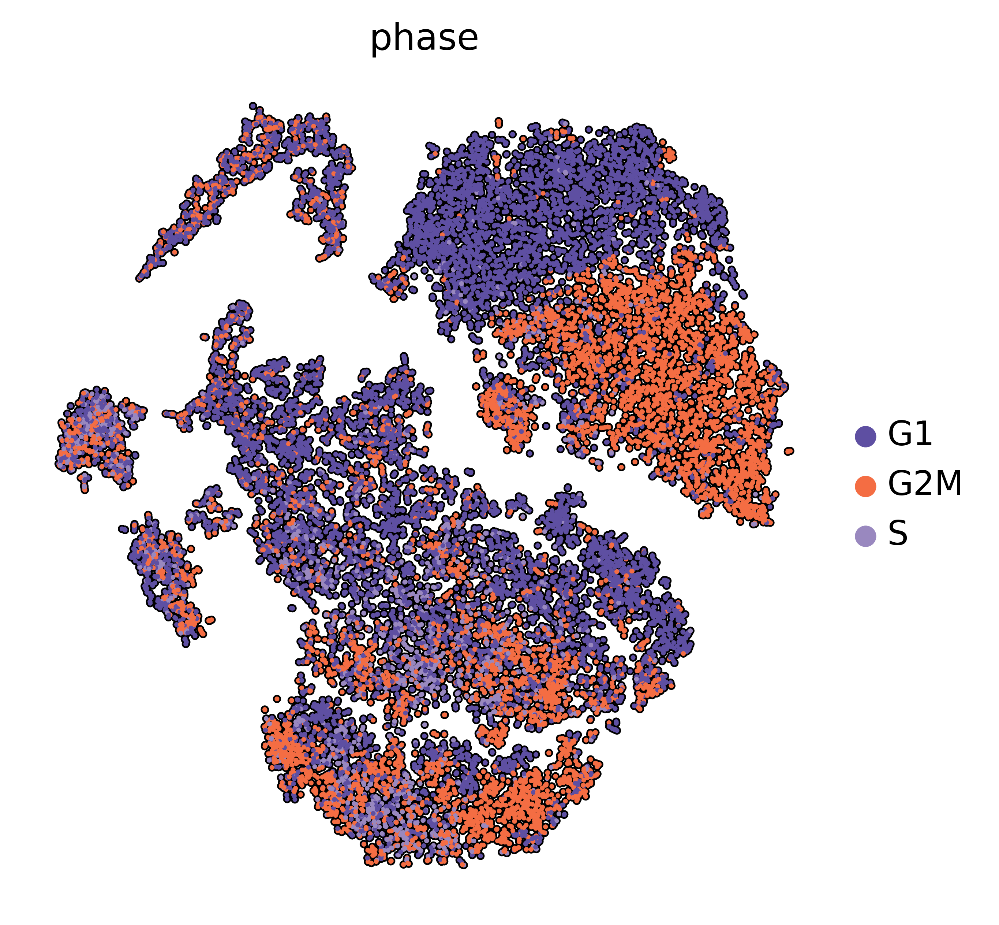

In [16]:
color="phase"

        # [
        #     "#5e4fa2",  # Deep purple
        #     "#7b68b0",  # Medium purple
        #     "#9988bf",  # Light lavender
        #     "#bfa7b7",  # Mauve / bridge color
        #     "#d88e6b",  # Orange-tan
        #     "#e07b45",  # Warm orange
        #     "#f46d43",  # Bright orange
        # ]


palette = {'G1': '#5e4fa2', 'G2M': '#f46d43', 'S': '#9988bf', 'NA': 'grey'}
sc.pl.tsne(
    adata,
    palette=palette,
    color=color,
    # sort_order=True,
    size=10,
    ncols=4,
    alpha=1,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    colorbar_loc=None,
    # palette='Blues',
    show=False
)

plt.savefig('umap_by_phase.png', bbox_inches='tight', transparent=True, dpi=300)

# Cell type proportions per condition


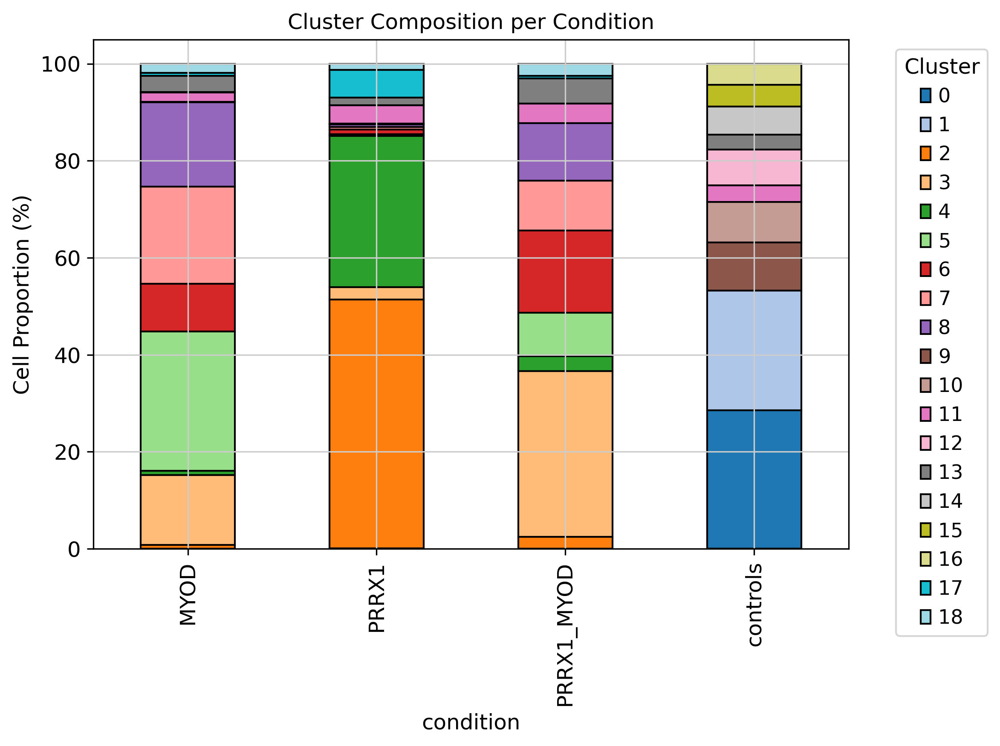

In [43]:


import pandas as pd

df = pd.crosstab(adata.obs['leiden'], adata.obs['condition'], normalize='columns') * 100
df.T.plot(kind='bar', stacked=True, figsize=(8, 6), colormap='tab20', edgecolor='k')
plt.ylabel("Cell Proportion (%)")
plt.title("Cluster Composition per Condition")
plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1))
plt.tight_layout()
plt.show()


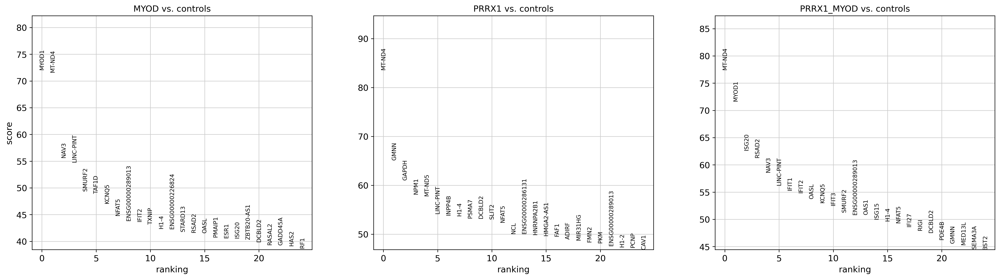

In [44]:
sc.tl.rank_genes_groups(adata, groupby='condition', method='wilcoxon', reference='controls')  # example

sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, title="DEGs: Each Condition vs Control")


In [45]:
# adata.raw = adata.copy()

# sc.pp.normalize_total(adata, target_sum=1e4)

# # 2. Log1p transform the data (natural log of 1 + x)
# sc.pp.log1p(adata)

# sc.tl.rank_genes_groups(adata, groupby='condition', method='wilcoxon')
# sc.pl.rank_genes_groups_heatmap(adata, n_genes=10, groupby='condition', cmap='bwr', show_gene_labels=True)

# # Calculate average expression per condition
# adata.obs['condition'] = adata.obs['condition'].astype('category')
# sc.tl.rank_genes_groups(adata, groupby='condition', method='logreg')



# Differentially expressed genes


In [11]:

sc.tl.rank_genes_groups(adata, groupby='condition', method='wilcoxon')

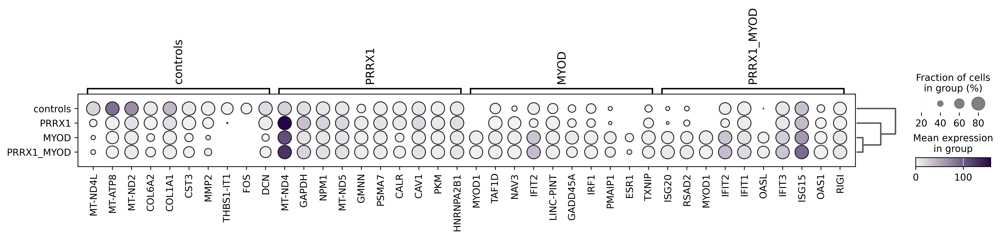

In [28]:
import matplotlib.colors as mcolors
from matplotlib.colors import to_rgba

colors = ["#f5f5f5", "#250547"]
 
custom_cmap = mcolors.LinearSegmentedColormap.from_list("teal_to_blue", colors)


dotplot = sc.pl.rank_genes_groups_dotplot(adata, n_genes=10, groupby='condition', dot_max=0.8, dot_min=0.2, color_map=custom_cmap, show=False, cmap=custom_cmap )

ax = dotplot['mainplot_ax']

for coll in ax.collections:
    colore = to_rgba('black', alpha=0.8)
    coll.set_edgecolor(colore) 
    coll.set_linewidth(1)
    coll.set_facecolor(coll.get_facecolor())
    

plt.savefig("differentially_expressed_genes_bordered.png", bbox_inches='tight', dpi=300, transparent=True)
# Show the modified plot
# dotplot['fig'].show()

In [ ]:
import matplotlib.colors as mcolors

colors = ["#f5f5f5", "#250547"]  # Light teal to dark blue

custom_cmap = mcolors.LinearSegmentedColormap.from_list("teal_to_blue", colors)


dotplot = sc.pl.rank_genes_groups_dotplot(adata, n_genes=10, groupby='condition', dot_max=0.8, dot_min=0.2, color_map=custom_cmap, show=False, cmap=custom_cmap, title="Top Expressed Genes")

ax = dotplot.get_axes()['mainplot_ax']

for coll in ax.collections:
    coll.set_edgecolor('black')      # Border color
    coll.set_linewidth(1.5)          # Border thickness
    coll.set_facecolor(coll.get_facecolor())  # Keep original fill


plt.savefig("top_expressed_genes_bordered.png", bbox_inches='tight', dpi=300)


In [ ]:
# Pseudotime analysis


sc.pp.neighbors(adata, use_rep='X')

sc.tl.diffmap(adata)
# sc.tl.dpt(adata, n_dcs=10, root_key='root_cells')  # optional root key

sc.tl.dpt(adata)

sc.pl.umap(adata, color='dpt_pseudotime', cmap='viridis', title="Pseudotime on UMAP")

adata.obs['pseudotime'] = adata.obs['dpt_pseudotime']


In [ ]:
qc_metrics = ['n_genes_by_counts', 'total_counts', 'pct_counts_mt']

for metric in qc_metrics:
    sc.pl.violin(adata, keys=metric, groupby="condition", stripplot=False, title=f"{metric} by Condition")
